# Business understanding

Generator planet 
- format wejściowy plików:  1920px/1080px
- format wyjściowy plików:  128px/128px

In [1]:
# import niezbednych bibliotek
import os
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from sklearn.preprocessing import LabelEncoder
from keras.models import load_model

In [2]:
# wersja tensorflow
print('tensorflow ver: ', tf.__version__)
print('keras ver     : ', tf.keras.__version__)

tensorflow ver:  2.10.1
keras ver     :  2.10.0


# Data understanding and data preparation

Dataset zrobiony z modeli udostępnionych przez NASA na stronie: nasa.gov
- 12 planet/gwiazd
- 100 zdjęć na planetę/gwiazde

wybór - 4 planet/gwiazd

In [3]:
dir_directory_path = './DATA/v1'

images_data = []
images_labels = []
    
subfolders = [ f.path for f in os.scandir(dir_directory_path) if f.is_dir() ]

for dir_path in subfolders:
    print('Loading data from folder', dir_path.replace("\\", "/"))

    if dir_path.find('earth') == -1 and dir_path.find('sun') == -1 and dir_path.find('mars') == -1: 
        continue
    
    dataset = tf.keras.preprocessing.image_dataset_from_directory(
                dir_path, 
                label_mode=None, 
                image_size=(128, 230), 
                batch_size=32,
                #color_mode='grayscale'
            )
    
    for i in dataset:
        for ii in i:            
            new_img = ii[0:128, 50: 178]
            images_data.append(new_img)
            images_labels.append(dir_path.replace(dir_directory_path, '').replace('\\',''))
                        
images_data = np.asarray(images_data)
images_labels = np.asarray(images_labels)

new_images_data = []
new_images_labels = []

for idx in range(0, images_data.shape[0]):
    img = Image.fromarray(np.uint8(images_data[idx]))
    class_name = images_labels[idx]
    
    new_images_data.append(np.asarray(img))
    new_images_labels.append(class_name)
    
    for i in range(180,360,180):
        rotated_img = img.rotate(i)
        new_images_data.append(np.asarray(rotated_img))
        new_images_labels.append(class_name)
                        
images_data = np.asarray(new_images_data)
images_labels = np.asarray(new_images_labels)        

label_encoder = LabelEncoder()
images_labels_num = label_encoder.fit_transform(images_labels)

print()
print('Shapes:')
print('images_labels      :', images_labels.shape)
print('-----------------------------')
print('images_data        :', images_data.shape)
print('images_labels_num  :', images_labels_num.shape)

Loading data from folder ./DATA/v1/ceres
Loading data from folder ./DATA/v1/earth
Found 100 files belonging to 1 classes.
Loading data from folder ./DATA/v1/earth_moon
Found 100 files belonging to 1 classes.
Loading data from folder ./DATA/v1/eris
Loading data from folder ./DATA/v1/hamuea
Loading data from folder ./DATA/v1/jupiter
Loading data from folder ./DATA/v1/makemake
Loading data from folder ./DATA/v1/mars
Found 100 files belonging to 1 classes.
Loading data from folder ./DATA/v1/mercury
Loading data from folder ./DATA/v1/pluto
Loading data from folder ./DATA/v1/sun
Found 100 files belonging to 1 classes.
Loading data from folder ./DATA/v1/venus

Shapes:
images_labels      : (800,)
-----------------------------
images_data        : (800, 128, 128, 3)
images_labels_num  : (800,)


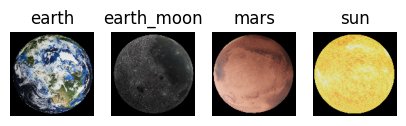

In [4]:
np.random.seed(100)

idx = 0
fig = plt.figure(figsize=(5, 5))
for i in np.unique(images_labels_num):    
    idx += 1
    class_position = np.where(images_labels_num  == i)[0]
    class_position = np.random.choice(class_position)
    plt.subplot(4, 4, idx)
    plt.imshow(images_data[class_position] / 255.)
    plt.title(images_labels[class_position])    
    plt.axis('off')
plt.show()
plt.close(fig)

In [5]:
train_images = images_data
train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]

In [6]:
train_images.shape

(800, 128, 128, 3)

# Modeling

In [7]:
# latent dimension of the random noise
LATENT_DIM = 100 
# weight initializer for G per DCGAN paper
WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02) 
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3 # UPDATED from 1  

In [8]:
def build_generator(image_size):
    
    size = int(image_size / 4)
    
    # create a Keras Sequential model 
    model = Sequential(name='generator')

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer  
    model.add(layers.Dense(size * size * 256, input_dim=LATENT_DIM))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(0.2))
    
    # 1D => 3D: reshape the output of the previous layer 
    model.add(layers.Reshape((size, size, 256)))

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding="same", use_bias=False, kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding="same", use_bias=False, kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())    
    model.add(layers.LeakyReLU())

    # last layer 
    model.add(layers.Conv2DTranspose(CHANNELS, (5, 5), strides=(2, 2), padding="same", use_bias=False, activation="tanh"))
        
    return model     


# build the generator model
generator = build_generator(128) 
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 262144)            26476544  
                                                                 
 batch_normalization (BatchN  (None, 262144)           1048576   
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 262144)            0         
                                                                 
 reshape (Reshape)           (None, 32, 32, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 32, 32, 64)       409600    
 nspose)                                                         
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 64)       25

c:\APLIKACJE\PyDataScience\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


In [9]:
def build_discriminator(height, width, depth, alpha=0.2):
    # create a Keras Sequential model
    model = Sequential(name='discriminator')
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (5, 5), padding="same", strides=(2, 2), input_shape=input_shape))
    #model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    model.add(layers.Dropout(0.3))
    
    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(32, (5, 5), padding="same", strides=(2, 2)))
    #model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    model.add(layers.Dropout(0.3))
    
    # flatten and apply dropout
    model.add(layers.Flatten())
    #model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation="sigmoid"))

    # return the discriminator model
    return model


# build the discriminator model
discriminator = build_discriminator(128, 128, 3) 
discriminator.summary()

Model: "discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 64, 64)        4864      
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                                 
 dropout (Dropout)           (None, 64, 64, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 32, 32, 32)        51232     
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 32)        0         
                                                                 
 dropout_1 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 flatten (Flatten)           (None, 32768)           

In [10]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Step 1. Train the discriminator with both real images (label as 1) and fake images (classified as label as 0) 
        with tf.GradientTape() as tape:
            # Compute discriminator loss on real images
            pred_real = self.discriminator(real_images, training=True)
            real_labels = tf.ones((batch_size, 1))
            # UPDATED: apply one-sided label smoothing to real labels
            real_labels += 0.05 * tf.random.uniform(tf.shape(real_labels)) 
            d_loss_real = self.loss_fn(real_labels, pred_real)

            # Compute discriminator loss on fake images
            fake_images = self.generator(noise)
            pred_fake = self.discriminator(fake_images, training=True)
            fake_labels = tf.zeros((batch_size, 1))
            # UPDATED: add random noise to fake labels - not needed
            # fake_labels += 0.05 * tf.random.uniform(tf.shape(fake_labels)) 
            d_loss_fake = self.loss_fn(fake_labels, pred_fake)

            # total discriminator loss
            d_loss = (d_loss_real + d_loss_fake)/2
        # Compute discriminator gradients
        grads = tape.gradient(d_loss, self.discriminator.trainable_variables)
        # Update discriminator weights
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_variables))

        # Step 2. Train the generator (do not update weights of the discriminator)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.discriminator(fake_images, training=True)
            g_loss = self.loss_fn(misleading_labels, pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}     

In [11]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(5, 5))
        for i in range(self.num_img):
            plt.subplot(4, 4, i+1)
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
        plt.savefig('./results_128_v1/epoch_{:03d}.jpg'.format(epoch + 1)) 
        if epoch == 0 or epoch % 10 == 0:
            plt.show()
        plt.close(fig)
                
        for i in range(self.num_img):
            fig = plt.figure(figsize=(1.6, 1.6))
            img = keras.utils.array_to_img(generated_images[i]) 
            plt.imshow(img)
            plt.axis('off')
            plt.savefig('./results_128_v1/images/S{:03d}_E{:03d}_IMG{:03d}.jpg'.format(SESJA, epoch + 1, i + 1)) 
            plt.close(fig)
        if epoch == 0 or epoch % 5 == 0:
            self.model.generator.save('./results_128_v1/generator_128_S{:03d}_E{:03d}_.h5'.format(SESJA, epoch + 1))

    def on_train_end(self, logs=None):
        self.model.generator.save('./results_128_v1/generator_128_S{:03d}_v1.h5'.format(SESJA))

# Evaluation

In [12]:
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=LATENT_DIM)

D_LR = 0.001 # UPDATED: discriminator learning rate
G_LR = 0.003 # UPDATED: generator learning rate

dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=D_LR, beta_1 = 0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=G_LR, beta_1 = 0.5),  
    loss_fn=keras.losses.BinaryCrossentropy(),
)

Epoch 1/500
25/25 [==============================] - ETA: 0s - d_loss: 0.7422 - g_loss: 1.9685

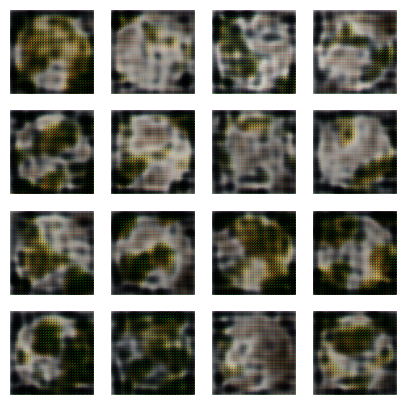

25/25 [==============================] - 21s 810ms/step - d_loss: 0.7422 - g_loss: 1.9685
Epoch 2/500
25/25 [==============================] - 20s 804ms/step - d_loss: 0.5270 - g_loss: 1.1549
Epoch 3/500
25/25 [==============================] - 22s 865ms/step - d_loss: -0.1101 - g_loss: 0.0066
Epoch 4/500
25/25 [==============================] - 21s 846ms/step - d_loss: -1.0242 - g_loss: 2.2632e-08
Epoch 5/500
25/25 [==============================] - 21s 855ms/step - d_loss: -75.7627 - g_loss: 0.0000e+00
Epoch 6/500
25/25 [==============================] - 21s 856ms/step - d_loss: -1418.5381 - g_loss: 0.0000e+00
Epoch 7/500
25/25 [==============================] - 21s 854ms/step - d_loss: -6389.1948 - g_loss: 0.0000e+00
Epoch 8/500
25/25 [==============================] - 22s 873ms/step - d_loss: -14887.5117 - g_loss: 0.0000e+00
Epoch 9/500
25/25 [==============================] - 22s 864ms/step - d_loss: -23368.9043 - g_loss: 0.0000e+00
Epoch 10/500
25/25 [============================

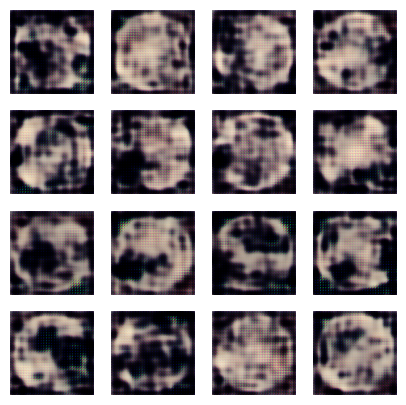

25/25 [==============================] - 22s 885ms/step - d_loss: -48500.0352 - g_loss: 0.0000e+00
Epoch 12/500
25/25 [==============================] - 22s 897ms/step - d_loss: -66755.7188 - g_loss: 0.0000e+00
Epoch 13/500
25/25 [==============================] - 21s 851ms/step - d_loss: 1989840.3750 - g_loss: 27092.9746
Epoch 14/500
25/25 [==============================] - 22s 862ms/step - d_loss: 1487068.3750 - g_loss: 15052.5625
Epoch 15/500
25/25 [==============================] - 22s 867ms/step - d_loss: 347090.0938 - g_loss: 11049.3975
Epoch 16/500
25/25 [==============================] - 22s 881ms/step - d_loss: 264523.5312 - g_loss: 10874.9805
Epoch 17/500
25/25 [==============================] - 22s 884ms/step - d_loss: 78282.1094 - g_loss: 7644.1606
Epoch 18/500
25/25 [==============================] - 22s 891ms/step - d_loss: 30426.4434 - g_loss: 5893.4795
Epoch 19/500
25/25 [==============================] - 23s 917ms/step - d_loss: 28718.6543 - g_loss: 4806.7495
Epoch 20/

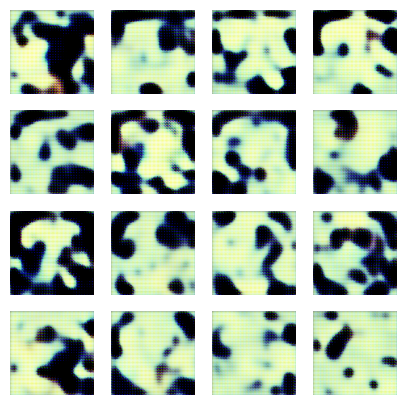

25/25 [==============================] - 23s 934ms/step - d_loss: 3282.9707 - g_loss: 753.8773
Epoch 22/500
25/25 [==============================] - 24s 948ms/step - d_loss: -506.5854 - g_loss: 94.5445
Epoch 23/500
25/25 [==============================] - 21s 846ms/step - d_loss: -1277.2146 - g_loss: 146.3790
Epoch 24/500
25/25 [==============================] - 22s 871ms/step - d_loss: -1501.3090 - g_loss: 83.1116
Epoch 25/500
25/25 [==============================] - 22s 866ms/step - d_loss: -2256.0510 - g_loss: 48.9826
Epoch 26/500
25/25 [==============================] - 23s 945ms/step - d_loss: -1239.8247 - g_loss: 230.9138
Epoch 27/500
25/25 [==============================] - 23s 933ms/step - d_loss: 366.6302 - g_loss: 505.4011
Epoch 28/500
25/25 [==============================] - 24s 943ms/step - d_loss: 6359.2363 - g_loss: 2310.9189
Epoch 29/500
25/25 [==============================] - 23s 915ms/step - d_loss: 8332.0166 - g_loss: 1908.8014
Epoch 30/500
25/25 [===================

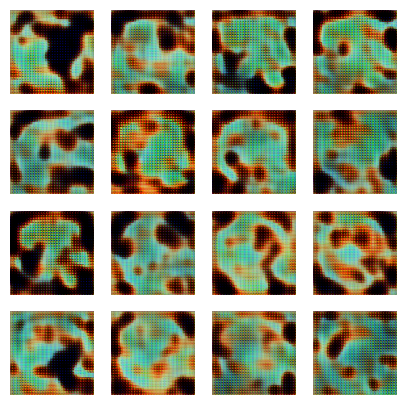

25/25 [==============================] - 24s 977ms/step - d_loss: 2100.1116 - g_loss: 369.0276
Epoch 32/500
25/25 [==============================] - 24s 944ms/step - d_loss: 3810.5354 - g_loss: 2597.5107
Epoch 33/500
25/25 [==============================] - 24s 963ms/step - d_loss: 11776.9473 - g_loss: 7153.5049
Epoch 34/500
25/25 [==============================] - 24s 974ms/step - d_loss: 4978.0898 - g_loss: 9212.2871
Epoch 35/500
25/25 [==============================] - 22s 875ms/step - d_loss: 3173.3726 - g_loss: 3633.3457
Epoch 36/500
25/25 [==============================] - 22s 894ms/step - d_loss: 3450.8762 - g_loss: 2178.0457
Epoch 37/500
25/25 [==============================] - 23s 911ms/step - d_loss: 3039.3335 - g_loss: 1585.8181
Epoch 38/500
25/25 [==============================] - 21s 847ms/step - d_loss: 5752.5205 - g_loss: 2298.3123
Epoch 39/500
25/25 [==============================] - 21s 849ms/step - d_loss: 23767.4922 - g_loss: 23767.9648
Epoch 40/500
25/25 [==========

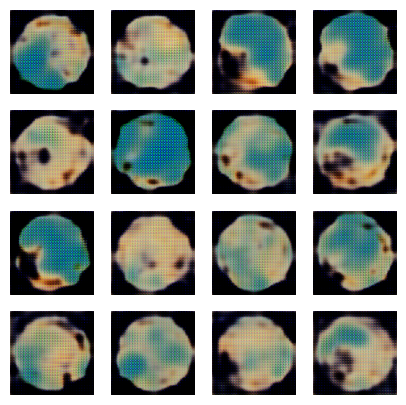

25/25 [==============================] - 22s 886ms/step - d_loss: 13250.1621 - g_loss: 5685.9907
Epoch 42/500
25/25 [==============================] - 22s 875ms/step - d_loss: 19563.1230 - g_loss: 7700.2036
Epoch 43/500
25/25 [==============================] - 22s 892ms/step - d_loss: 17720.4609 - g_loss: 10040.2314
Epoch 44/500
25/25 [==============================] - 24s 971ms/step - d_loss: 15759.5078 - g_loss: 8067.9390
Epoch 45/500
25/25 [==============================] - 22s 871ms/step - d_loss: 17449.5566 - g_loss: 6653.3735
Epoch 46/500
25/25 [==============================] - 23s 920ms/step - d_loss: 17468.0059 - g_loss: 7154.7319
Epoch 47/500
25/25 [==============================] - 22s 899ms/step - d_loss: 15332.8359 - g_loss: 5498.8843
Epoch 48/500
25/25 [==============================] - 22s 883ms/step - d_loss: 13204.7021 - g_loss: 7116.4033
Epoch 49/500
25/25 [==============================] - 23s 903ms/step - d_loss: 14412.0430 - g_loss: 6633.7471
Epoch 50/500
25/25 [==

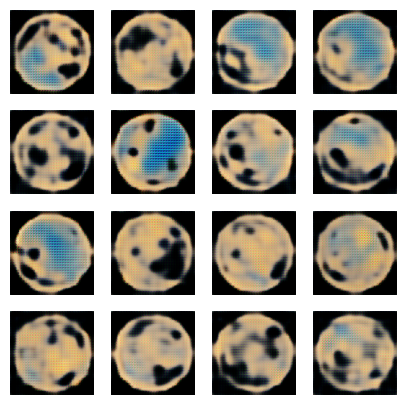

25/25 [==============================] - 23s 931ms/step - d_loss: 13913.6865 - g_loss: 7492.7905
Epoch 52/500
25/25 [==============================] - 23s 928ms/step - d_loss: 12060.5479 - g_loss: 6991.0801
Epoch 53/500
25/25 [==============================] - 24s 972ms/step - d_loss: 12446.7822 - g_loss: 9085.1348
Epoch 54/500
25/25 [==============================] - 21s 862ms/step - d_loss: 13207.7773 - g_loss: 9844.4609
Epoch 55/500
25/25 [==============================] - 22s 868ms/step - d_loss: 14526.1299 - g_loss: 8862.8623
Epoch 56/500
25/25 [==============================] - 22s 874ms/step - d_loss: 12336.1621 - g_loss: 6870.0137
Epoch 57/500
25/25 [==============================] - 22s 887ms/step - d_loss: 11404.4561 - g_loss: 9680.3809
Epoch 58/500
25/25 [==============================] - 22s 871ms/step - d_loss: 11820.4746 - g_loss: 8414.8945
Epoch 59/500
25/25 [==============================] - 22s 886ms/step - d_loss: 12349.6055 - g_loss: 9295.3760
Epoch 60/500
25/25 [===

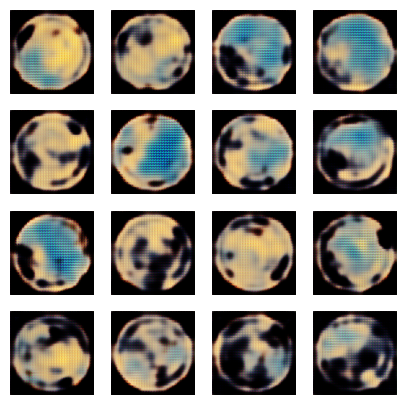

25/25 [==============================] - 23s 907ms/step - d_loss: 11059.9326 - g_loss: 9720.9248
Epoch 62/500
25/25 [==============================] - 23s 917ms/step - d_loss: 10137.9131 - g_loss: 6668.5610
Epoch 63/500
25/25 [==============================] - 24s 946ms/step - d_loss: 11143.9961 - g_loss: 9409.8867
Epoch 64/500
25/25 [==============================] - 24s 954ms/step - d_loss: 9891.6396 - g_loss: 7522.4033
Epoch 65/500
25/25 [==============================] - 21s 857ms/step - d_loss: 10679.4648 - g_loss: 9098.8691
Epoch 66/500
25/25 [==============================] - 22s 871ms/step - d_loss: 10596.6211 - g_loss: 7482.7900
Epoch 67/500
25/25 [==============================] - 22s 884ms/step - d_loss: 10450.5078 - g_loss: 7744.3750
Epoch 68/500
25/25 [==============================] - 22s 882ms/step - d_loss: 10321.0947 - g_loss: 7469.9517
Epoch 69/500
25/25 [==============================] - 22s 897ms/step - d_loss: 8615.0264 - g_loss: 7040.5762
Epoch 70/500
25/25 [=====

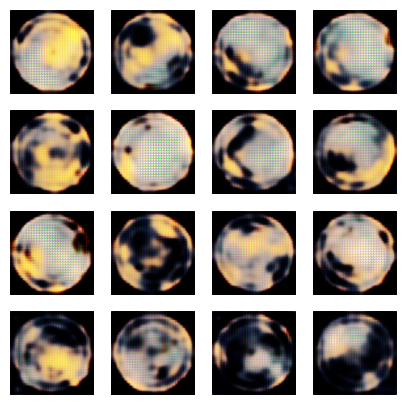

25/25 [==============================] - 24s 947ms/step - d_loss: 10924.2305 - g_loss: 8782.2334
Epoch 72/500
25/25 [==============================] - 24s 945ms/step - d_loss: 10428.6094 - g_loss: 7591.5000
Epoch 73/500
25/25 [==============================] - 24s 960ms/step - d_loss: 9752.8535 - g_loss: 5503.4150
Epoch 74/500
25/25 [==============================] - 25s 989ms/step - d_loss: 9558.3076 - g_loss: 6112.0923
Epoch 75/500
25/25 [==============================] - 21s 857ms/step - d_loss: 9699.1396 - g_loss: 5758.8096
Epoch 76/500
25/25 [==============================] - 22s 868ms/step - d_loss: 10006.6885 - g_loss: 7509.2500
Epoch 77/500
25/25 [==============================] - 22s 878ms/step - d_loss: 9429.0547 - g_loss: 5286.1045
Epoch 78/500
25/25 [==============================] - 22s 881ms/step - d_loss: 8906.6152 - g_loss: 7143.0068
Epoch 79/500
25/25 [==============================] - 22s 880ms/step - d_loss: 9265.4785 - g_loss: 5683.6948
Epoch 80/500
25/25 [=========

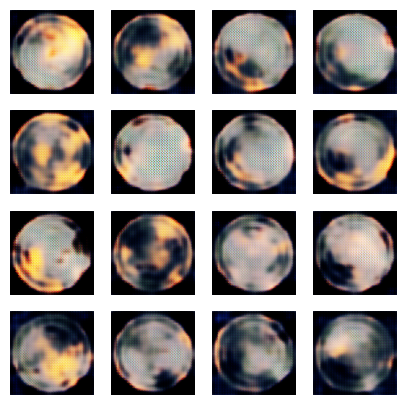

25/25 [==============================] - 23s 927ms/step - d_loss: 8515.7900 - g_loss: 6008.6758
Epoch 82/500
25/25 [==============================] - 23s 923ms/step - d_loss: 7692.8311 - g_loss: 4743.6895
Epoch 83/500
25/25 [==============================] - 24s 946ms/step - d_loss: 7821.3164 - g_loss: 6867.0493
Epoch 84/500
25/25 [==============================] - 25s 992ms/step - d_loss: 8646.1328 - g_loss: 5823.0889
Epoch 85/500
25/25 [==============================] - 21s 863ms/step - d_loss: 7468.0542 - g_loss: 4128.4746
Epoch 86/500
25/25 [==============================] - 22s 876ms/step - d_loss: 7781.7568 - g_loss: 4473.5063
Epoch 87/500
25/25 [==============================] - 22s 877ms/step - d_loss: 8984.6475 - g_loss: 5316.1289
Epoch 88/500
25/25 [==============================] - 23s 916ms/step - d_loss: 9480.8477 - g_loss: 6547.3379
Epoch 89/500
25/25 [==============================] - 24s 943ms/step - d_loss: 8702.9131 - g_loss: 4205.4297
Epoch 90/500
25/25 [============

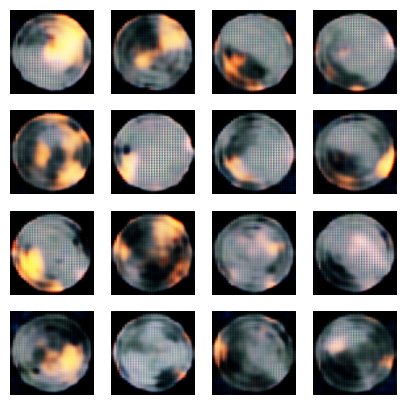

25/25 [==============================] - 24s 979ms/step - d_loss: 9647.0850 - g_loss: 6699.7227
Epoch 92/500
25/25 [==============================] - 25s 999ms/step - d_loss: 9781.8877 - g_loss: 5612.4971
Epoch 93/500
25/25 [==============================] - 21s 853ms/step - d_loss: 8836.1748 - g_loss: 5806.4170
Epoch 94/500
25/25 [==============================] - 21s 861ms/step - d_loss: 8424.3721 - g_loss: 5892.6802
Epoch 95/500
25/25 [==============================] - 22s 865ms/step - d_loss: 9922.1201 - g_loss: 5448.8687
Epoch 96/500
25/25 [==============================] - 22s 868ms/step - d_loss: 10163.6758 - g_loss: 5094.8521
Epoch 97/500
25/25 [==============================] - 22s 879ms/step - d_loss: 9198.7578 - g_loss: 5679.9507
Epoch 98/500
25/25 [==============================] - 23s 922ms/step - d_loss: 9525.7549 - g_loss: 6856.1543
Epoch 99/500
25/25 [==============================] - 23s 920ms/step - d_loss: 9190.1201 - g_loss: 4272.8438
Epoch 100/500
25/25 [==========

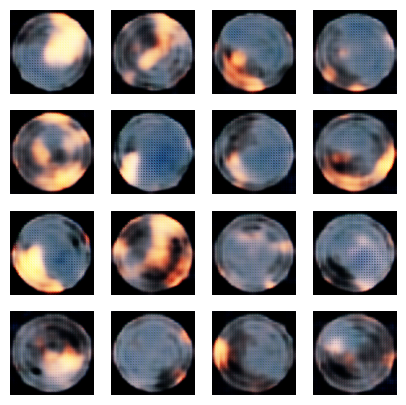

25/25 [==============================] - 23s 927ms/step - d_loss: 9198.0859 - g_loss: 5274.1279
Epoch 102/500
25/25 [==============================] - 24s 949ms/step - d_loss: 8254.8867 - g_loss: 4844.3188
Epoch 103/500
25/25 [==============================] - 23s 942ms/step - d_loss: 7478.9473 - g_loss: 5397.1426
Epoch 104/500
25/25 [==============================] - 24s 970ms/step - d_loss: 7984.4995 - g_loss: 5122.1958
Epoch 105/500
25/25 [==============================] - 22s 866ms/step - d_loss: 7652.5488 - g_loss: 4299.2090
Epoch 106/500
25/25 [==============================] - 22s 873ms/step - d_loss: 7177.1831 - g_loss: 4391.5996
Epoch 107/500
25/25 [==============================] - 22s 879ms/step - d_loss: 8234.8291 - g_loss: 5120.7256
Epoch 108/500
25/25 [==============================] - 22s 877ms/step - d_loss: 7033.8389 - g_loss: 4512.2637
Epoch 109/500
25/25 [==============================] - 22s 902ms/step - d_loss: 7984.0879 - g_loss: 4754.4375
Epoch 110/500
25/25 [===

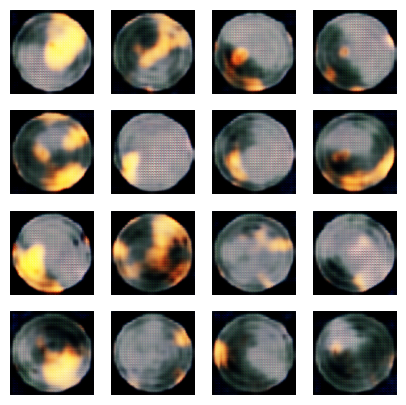

25/25 [==============================] - 25s 995ms/step - d_loss: 8794.9697 - g_loss: 7396.3970
Epoch 112/500
25/25 [==============================] - 25s 987ms/step - d_loss: 7907.6401 - g_loss: 4645.0405
Epoch 113/500
25/25 [==============================] - 25s 996ms/step - d_loss: 8203.5312 - g_loss: 5015.6021
Epoch 114/500
25/25 [==============================] - 25s 1s/step - d_loss: 8079.8242 - g_loss: 7261.4150
Epoch 115/500
25/25 [==============================] - 22s 871ms/step - d_loss: 7306.9888 - g_loss: 5181.2495
Epoch 116/500
25/25 [==============================] - 22s 886ms/step - d_loss: 6664.2070 - g_loss: 5006.5376
Epoch 117/500
25/25 [==============================] - 22s 900ms/step - d_loss: 7754.2148 - g_loss: 5471.7827
Epoch 118/500
25/25 [==============================] - 23s 902ms/step - d_loss: 8990.0771 - g_loss: 6859.5112
Epoch 119/500
25/25 [==============================] - 23s 922ms/step - d_loss: 7155.0024 - g_loss: 5232.1787
Epoch 120/500
25/25 [======

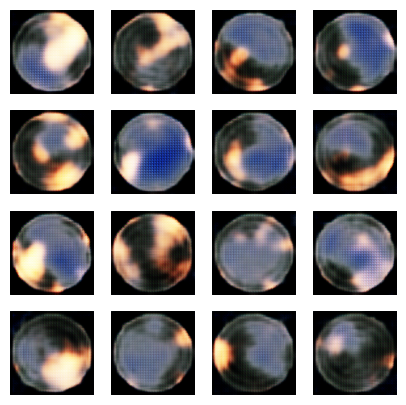

25/25 [==============================] - 24s 963ms/step - d_loss: 7134.5049 - g_loss: 7096.5981
Epoch 122/500
25/25 [==============================] - 24s 960ms/step - d_loss: 6192.0996 - g_loss: 4940.8223
Epoch 123/500
25/25 [==============================] - 25s 987ms/step - d_loss: 6502.1626 - g_loss: 4699.4004
Epoch 124/500
25/25 [==============================] - 25s 1000ms/step - d_loss: 6614.6289 - g_loss: 4685.1567
Epoch 125/500
25/25 [==============================] - 22s 877ms/step - d_loss: 5881.9233 - g_loss: 4883.0439
Epoch 126/500
25/25 [==============================] - 22s 882ms/step - d_loss: 6478.6724 - g_loss: 4943.3267
Epoch 127/500
25/25 [==============================] - 22s 894ms/step - d_loss: 6936.0293 - g_loss: 4512.6968
Epoch 128/500
25/25 [==============================] - 22s 900ms/step - d_loss: 6364.7358 - g_loss: 4766.3193
Epoch 129/500
25/25 [==============================] - 23s 914ms/step - d_loss: 6281.4395 - g_loss: 5421.1299
Epoch 130/500
25/25 [==

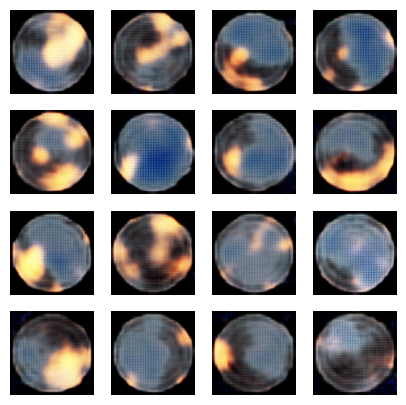

25/25 [==============================] - 24s 965ms/step - d_loss: 6415.3530 - g_loss: 5375.8438
Epoch 132/500
25/25 [==============================] - 25s 995ms/step - d_loss: 5650.0566 - g_loss: 4238.7505
Epoch 133/500
25/25 [==============================] - 21s 855ms/step - d_loss: 6157.4146 - g_loss: 4715.6553
Epoch 134/500
25/25 [==============================] - 21s 859ms/step - d_loss: 6101.7964 - g_loss: 5176.9512
Epoch 135/500
25/25 [==============================] - 22s 878ms/step - d_loss: 5919.0474 - g_loss: 3526.9475
Epoch 136/500
25/25 [==============================] - 22s 888ms/step - d_loss: 6877.1558 - g_loss: 4726.1699
Epoch 137/500
25/25 [==============================] - 23s 906ms/step - d_loss: 5819.2964 - g_loss: 4744.4536
Epoch 138/500
25/25 [==============================] - 24s 965ms/step - d_loss: 6150.4829 - g_loss: 4992.8818
Epoch 139/500
25/25 [==============================] - 25s 1s/step - d_loss: 6071.3442 - g_loss: 4968.0137
Epoch 140/500
25/25 [======

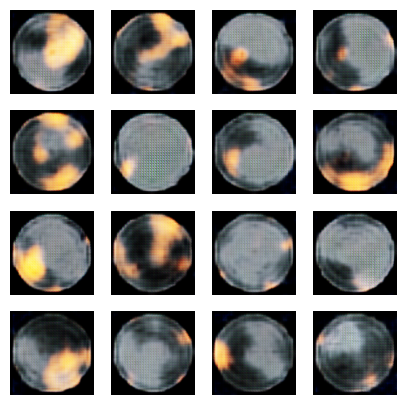

25/25 [==============================] - 26s 1s/step - d_loss: 5806.1924 - g_loss: 4549.9346
Epoch 142/500
25/25 [==============================] - 26s 1s/step - d_loss: 5009.9219 - g_loss: 4686.3096
Epoch 143/500
25/25 [==============================] - 26s 1s/step - d_loss: 6724.7148 - g_loss: 5653.6401
Epoch 144/500
25/25 [==============================] - 32s 1s/step - d_loss: 5921.4390 - g_loss: 4750.2729
Epoch 145/500
25/25 [==============================] - 22s 902ms/step - d_loss: 7007.1812 - g_loss: 5072.3018
Epoch 146/500
25/25 [==============================] - 23s 917ms/step - d_loss: 5843.9873 - g_loss: 4349.6455
Epoch 147/500
25/25 [==============================] - 23s 941ms/step - d_loss: 6300.7476 - g_loss: 4853.0044
Epoch 148/500
25/25 [==============================] - 23s 940ms/step - d_loss: 5363.8525 - g_loss: 3878.7180
Epoch 149/500
25/25 [==============================] - 23s 915ms/step - d_loss: 5258.9038 - g_loss: 4330.9004
Epoch 150/500
25/25 [===============

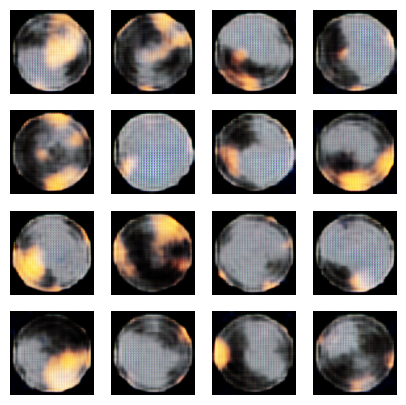

25/25 [==============================] - 24s 968ms/step - d_loss: 5535.1758 - g_loss: 4952.4512
Epoch 152/500
25/25 [==============================] - 24s 966ms/step - d_loss: 5579.1021 - g_loss: 4279.0083
Epoch 153/500
25/25 [==============================] - 24s 974ms/step - d_loss: 5193.8340 - g_loss: 4290.5537
Epoch 154/500
25/25 [==============================] - 25s 1s/step - d_loss: 5017.1411 - g_loss: 4504.8892
Epoch 155/500
25/25 [==============================] - 21s 854ms/step - d_loss: 6229.7949 - g_loss: 4643.0439
Epoch 156/500
25/25 [==============================] - 22s 867ms/step - d_loss: 5622.4414 - g_loss: 4888.1079
Epoch 157/500
25/25 [==============================] - 22s 862ms/step - d_loss: 5891.4077 - g_loss: 5331.5542
Epoch 158/500
25/25 [==============================] - 22s 873ms/step - d_loss: 5571.8608 - g_loss: 4645.7954
Epoch 159/500
25/25 [==============================] - 22s 895ms/step - d_loss: 5908.1133 - g_loss: 5583.2261
Epoch 160/500
25/25 [======

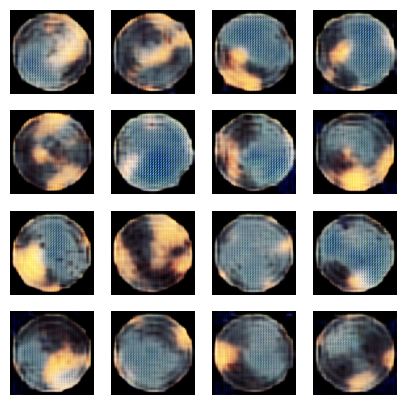

25/25 [==============================] - 23s 931ms/step - d_loss: 6011.3789 - g_loss: 4597.9819
Epoch 162/500
25/25 [==============================] - 24s 953ms/step - d_loss: 5325.2515 - g_loss: 3859.8450
Epoch 163/500
25/25 [==============================] - 24s 963ms/step - d_loss: 4850.7017 - g_loss: 3809.7646
Epoch 164/500
25/25 [==============================] - 21s 849ms/step - d_loss: 4644.8223 - g_loss: 3703.6150
Epoch 165/500
25/25 [==============================] - 21s 859ms/step - d_loss: 5083.5522 - g_loss: 3608.7476
Epoch 166/500
25/25 [==============================] - 22s 867ms/step - d_loss: 4253.6626 - g_loss: 4096.2295
Epoch 167/500
25/25 [==============================] - 22s 868ms/step - d_loss: 4649.4424 - g_loss: 3816.1868
Epoch 168/500
25/25 [==============================] - 22s 886ms/step - d_loss: 5355.3496 - g_loss: 4413.3652
Epoch 169/500
25/25 [==============================] - 23s 929ms/step - d_loss: 4858.1880 - g_loss: 3715.3696
Epoch 170/500
25/25 [===

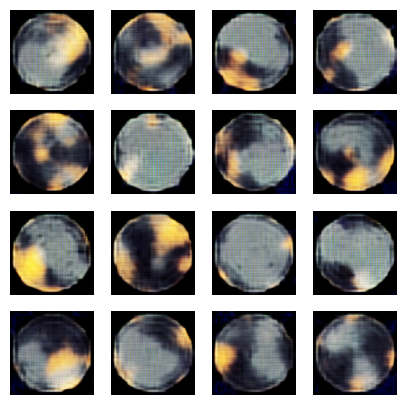

25/25 [==============================] - 25s 988ms/step - d_loss: 5276.7539 - g_loss: 3923.0466
Epoch 172/500
25/25 [==============================] - 25s 1s/step - d_loss: 4564.3120 - g_loss: 4016.4099
Epoch 173/500
25/25 [==============================] - 21s 859ms/step - d_loss: 4826.6514 - g_loss: 4534.3369
Epoch 174/500
25/25 [==============================] - 21s 858ms/step - d_loss: 4770.4824 - g_loss: 3569.0745
Epoch 175/500
25/25 [==============================] - 22s 872ms/step - d_loss: 5715.6514 - g_loss: 4118.9434
Epoch 176/500
25/25 [==============================] - 22s 896ms/step - d_loss: 4550.8320 - g_loss: 4548.3062
Epoch 177/500
25/25 [==============================] - 23s 909ms/step - d_loss: 5681.4004 - g_loss: 4625.4492
Epoch 178/500
25/25 [==============================] - 23s 926ms/step - d_loss: 5252.0488 - g_loss: 3782.4253
Epoch 179/500
25/25 [==============================] - 24s 949ms/step - d_loss: 5005.4927 - g_loss: 4820.0952
Epoch 180/500
25/25 [======

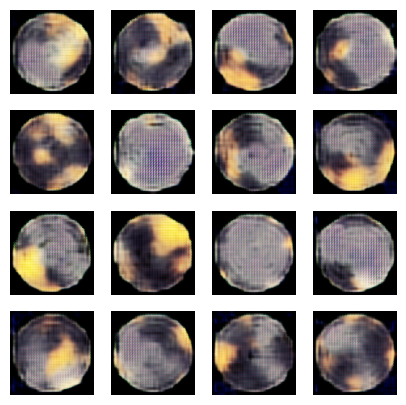

25/25 [==============================] - 25s 998ms/step - d_loss: 4524.0400 - g_loss: 4525.4966
Epoch 182/500
25/25 [==============================] - 26s 1s/step - d_loss: 4484.7695 - g_loss: 4007.5312
Epoch 183/500
25/25 [==============================] - 21s 848ms/step - d_loss: 4578.1865 - g_loss: 4241.5171
Epoch 184/500
25/25 [==============================] - 21s 855ms/step - d_loss: 4114.5596 - g_loss: 3312.0725
Epoch 185/500
25/25 [==============================] - 21s 848ms/step - d_loss: 3449.2925 - g_loss: 3688.6941
Epoch 186/500
25/25 [==============================] - 22s 871ms/step - d_loss: 5358.0215 - g_loss: 3488.7346
Epoch 187/500
25/25 [==============================] - 22s 878ms/step - d_loss: 5089.9390 - g_loss: 4032.3169
Epoch 188/500
25/25 [==============================] - 22s 882ms/step - d_loss: 4196.1777 - g_loss: 3394.5359
Epoch 189/500
25/25 [==============================] - 23s 911ms/step - d_loss: 4482.4668 - g_loss: 3682.1194
Epoch 190/500
25/25 [======

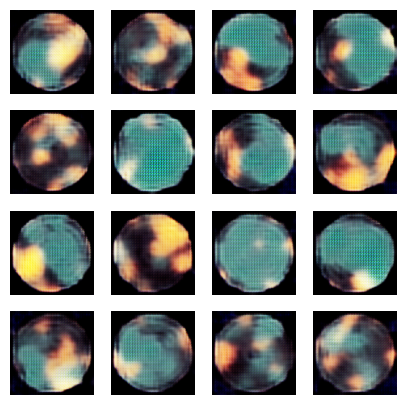

25/25 [==============================] - 25s 997ms/step - d_loss: 4592.8022 - g_loss: 4121.0317
Epoch 192/500
25/25 [==============================] - 25s 1s/step - d_loss: 3752.0398 - g_loss: 3687.6038
Epoch 193/500
25/25 [==============================] - 26s 1s/step - d_loss: 4233.3477 - g_loss: 3916.5259
Epoch 194/500
25/25 [==============================] - 27s 1s/step - d_loss: 4720.3320 - g_loss: 4701.5903
Epoch 195/500
25/25 [==============================] - 22s 885ms/step - d_loss: 4958.0098 - g_loss: 4239.7510
Epoch 196/500
25/25 [==============================] - 22s 883ms/step - d_loss: 4092.6196 - g_loss: 4153.7358
Epoch 197/500
25/25 [==============================] - 22s 882ms/step - d_loss: 4706.9414 - g_loss: 4092.1677
Epoch 198/500
25/25 [==============================] - 22s 879ms/step - d_loss: 5015.8735 - g_loss: 4375.9692
Epoch 199/500
25/25 [==============================] - 22s 898ms/step - d_loss: 4340.9077 - g_loss: 3163.3809
Epoch 200/500
25/25 [============

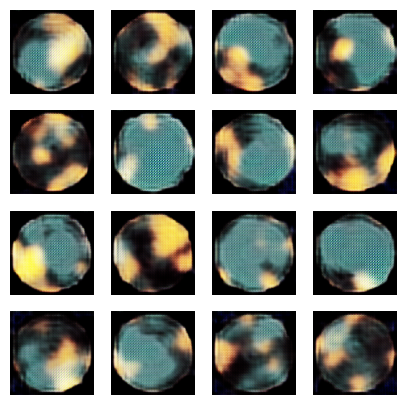

25/25 [==============================] - 23s 911ms/step - d_loss: 4516.3477 - g_loss: 4019.2468
Epoch 202/500
25/25 [==============================] - 23s 916ms/step - d_loss: 4633.8677 - g_loss: 4510.2642
Epoch 203/500
25/25 [==============================] - 23s 929ms/step - d_loss: 4266.0620 - g_loss: 3491.8738
Epoch 204/500
25/25 [==============================] - 21s 849ms/step - d_loss: 4459.0483 - g_loss: 4825.4619
Epoch 205/500
25/25 [==============================] - 22s 865ms/step - d_loss: 3906.8528 - g_loss: 6793.6987
Epoch 206/500
25/25 [==============================] - 22s 867ms/step - d_loss: 5210.8535 - g_loss: 6780.7456
Epoch 207/500
25/25 [==============================] - 22s 881ms/step - d_loss: 5330.7104 - g_loss: 5197.6094
Epoch 208/500
25/25 [==============================] - 22s 890ms/step - d_loss: 3875.8362 - g_loss: 3304.2273
Epoch 209/500
25/25 [==============================] - 22s 895ms/step - d_loss: 2165.9617 - g_loss: 3372.0037
Epoch 210/500
25/25 [===

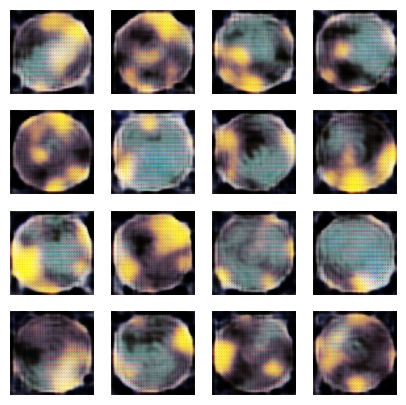

25/25 [==============================] - 23s 940ms/step - d_loss: 2274.2419 - g_loss: 3215.3850
Epoch 212/500
25/25 [==============================] - 23s 936ms/step - d_loss: 4245.9126 - g_loss: 3415.4680
Epoch 213/500
25/25 [==============================] - 24s 952ms/step - d_loss: 6105.4058 - g_loss: 7859.8232
Epoch 214/500
25/25 [==============================] - 25s 987ms/step - d_loss: 5865.3594 - g_loss: 8281.2754
Epoch 215/500
25/25 [==============================] - 26s 1s/step - d_loss: 2246.2390 - g_loss: 5324.3579
Epoch 216/500
25/25 [==============================] - 22s 867ms/step - d_loss: 2120.4580 - g_loss: 3345.0222
Epoch 217/500
25/25 [==============================] - 22s 880ms/step - d_loss: 1586.1843 - g_loss: 4303.8345
Epoch 218/500
25/25 [==============================] - 23s 920ms/step - d_loss: 2007.4872 - g_loss: 6927.5762
Epoch 219/500
25/25 [==============================] - 23s 935ms/step - d_loss: 4965.0752 - g_loss: 7109.9175
Epoch 220/500
25/25 [======

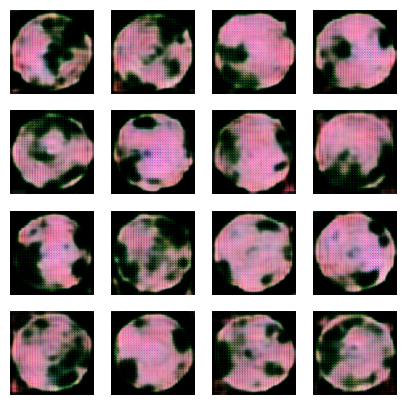

25/25 [==============================] - 25s 999ms/step - d_loss: 5025.1299 - g_loss: 8503.6260
Epoch 222/500
25/25 [==============================] - 25s 995ms/step - d_loss: 2884.0391 - g_loss: 5112.8975
Epoch 223/500
25/25 [==============================] - 25s 1s/step - d_loss: 1984.4670 - g_loss: 3582.1050
Epoch 224/500
25/25 [==============================] - 26s 1s/step - d_loss: 820.1036 - g_loss: 1399.7512
Epoch 225/500
25/25 [==============================] - 27s 1s/step - d_loss: 1255.3308 - g_loss: 2917.8281
Epoch 226/500
25/25 [==============================] - 21s 858ms/step - d_loss: 2153.3779 - g_loss: 2902.2053
Epoch 227/500
25/25 [==============================] - 21s 859ms/step - d_loss: 3247.4041 - g_loss: 3928.1799
Epoch 228/500
25/25 [==============================] - 22s 873ms/step - d_loss: 3059.7791 - g_loss: 3603.0713
Epoch 229/500
25/25 [==============================] - 22s 892ms/step - d_loss: 2492.5085 - g_loss: 3372.5466
Epoch 230/500
25/25 [=============

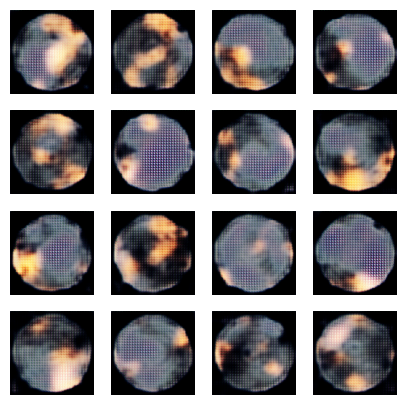

25/25 [==============================] - 24s 980ms/step - d_loss: 2626.1707 - g_loss: 2865.9099
Epoch 232/500
25/25 [==============================] - 21s 855ms/step - d_loss: 2812.4561 - g_loss: 3098.9502
Epoch 233/500
25/25 [==============================] - 22s 863ms/step - d_loss: 2854.0945 - g_loss: 3719.3054
Epoch 234/500
25/25 [==============================] - 21s 858ms/step - d_loss: 3080.6045 - g_loss: 3434.6125
Epoch 235/500
25/25 [==============================] - 22s 871ms/step - d_loss: 3547.2737 - g_loss: 3406.9707
Epoch 236/500
25/25 [==============================] - 22s 875ms/step - d_loss: 3552.5859 - g_loss: 3590.9907
Epoch 237/500
25/25 [==============================] - 22s 882ms/step - d_loss: 4092.4700 - g_loss: 3599.2798
Epoch 238/500
25/25 [==============================] - 22s 890ms/step - d_loss: 3685.5171 - g_loss: 3775.5774
Epoch 239/500
25/25 [==============================] - 23s 911ms/step - d_loss: 3604.3210 - g_loss: 3609.0393
Epoch 240/500
25/25 [===

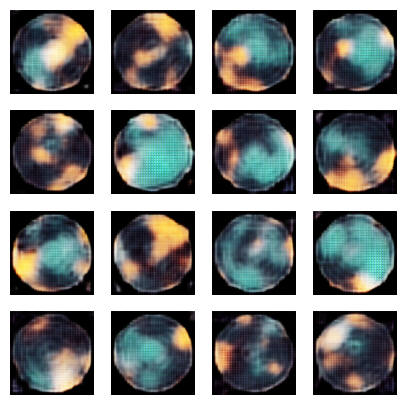

25/25 [==============================] - 24s 962ms/step - d_loss: 3199.3000 - g_loss: 3625.0515
Epoch 242/500
25/25 [==============================] - 24s 978ms/step - d_loss: 2928.3125 - g_loss: 2927.0830
Epoch 243/500
25/25 [==============================] - 25s 996ms/step - d_loss: 2742.2498 - g_loss: 3083.3770
Epoch 244/500
25/25 [==============================] - 25s 1s/step - d_loss: 2736.6675 - g_loss: 2867.8926
Epoch 245/500
25/25 [==============================] - 26s 1s/step - d_loss: 4062.3708 - g_loss: 3441.6709
Epoch 246/500
25/25 [==============================] - 22s 865ms/step - d_loss: 3187.9810 - g_loss: 3210.4375
Epoch 247/500
25/25 [==============================] - 22s 872ms/step - d_loss: 3788.9387 - g_loss: 3687.2441
Epoch 248/500
25/25 [==============================] - 22s 894ms/step - d_loss: 2843.4775 - g_loss: 3173.4355
Epoch 249/500
25/25 [==============================] - 22s 897ms/step - d_loss: 2870.4014 - g_loss: 2755.4712
Epoch 250/500
25/25 [=========

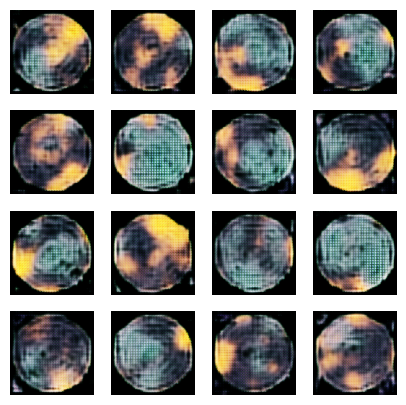

25/25 [==============================] - 25s 987ms/step - d_loss: 2998.0271 - g_loss: 3369.9163
Epoch 252/500
25/25 [==============================] - 25s 998ms/step - d_loss: 3345.2566 - g_loss: 2721.8391
Epoch 253/500
25/25 [==============================] - 25s 1s/step - d_loss: 3312.2939 - g_loss: 3341.1052
Epoch 254/500
25/25 [==============================] - 26s 1s/step - d_loss: 3081.8579 - g_loss: 3616.9363
Epoch 255/500
25/25 [==============================] - 27s 1s/step - d_loss: 3125.3760 - g_loss: 3352.6226
Epoch 256/500
25/25 [==============================] - 22s 864ms/step - d_loss: 2920.5713 - g_loss: 2962.1531
Epoch 257/500
25/25 [==============================] - 21s 859ms/step - d_loss: 4233.4727 - g_loss: 3760.8584
Epoch 258/500
25/25 [==============================] - 22s 891ms/step - d_loss: 3340.3984 - g_loss: 3305.5146
Epoch 259/500
25/25 [==============================] - 23s 917ms/step - d_loss: 2633.6670 - g_loss: 3380.5823
Epoch 260/500
25/25 [============

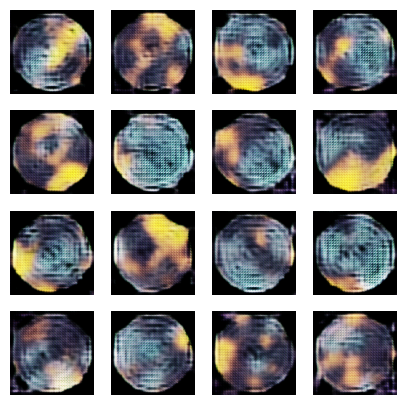

25/25 [==============================] - 24s 980ms/step - d_loss: 3305.3137 - g_loss: 3034.1069
Epoch 262/500
25/25 [==============================] - 21s 844ms/step - d_loss: 2734.0540 - g_loss: 2559.4531
Epoch 263/500
25/25 [==============================] - 21s 849ms/step - d_loss: 3323.0710 - g_loss: 3264.3975
Epoch 264/500
25/25 [==============================] - 21s 859ms/step - d_loss: 3571.1240 - g_loss: 3505.2019
Epoch 265/500
25/25 [==============================] - 22s 866ms/step - d_loss: 3090.5112 - g_loss: 3112.4814
Epoch 266/500
25/25 [==============================] - 22s 866ms/step - d_loss: 2336.7288 - g_loss: 2367.9846
Epoch 267/500
25/25 [==============================] - 22s 872ms/step - d_loss: 3172.3987 - g_loss: 3640.8613
Epoch 268/500
25/25 [==============================] - 22s 875ms/step - d_loss: 2729.8193 - g_loss: 2902.8638
Epoch 269/500
25/25 [==============================] - 22s 891ms/step - d_loss: 2702.0640 - g_loss: 3068.8425
Epoch 270/500
25/25 [===

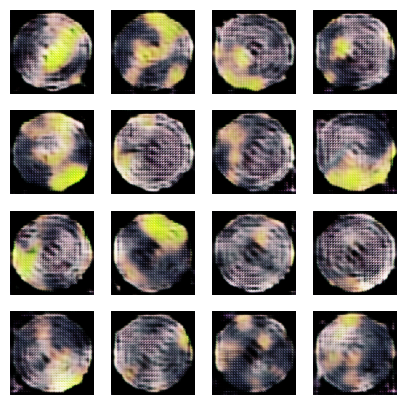

25/25 [==============================] - 24s 943ms/step - d_loss: 2441.6125 - g_loss: 2900.6855
Epoch 272/500
25/25 [==============================] - 24s 946ms/step - d_loss: 2500.5896 - g_loss: 2751.4729
Epoch 273/500
25/25 [==============================] - 24s 953ms/step - d_loss: 2852.3037 - g_loss: 3054.5269
Epoch 274/500
25/25 [==============================] - 24s 971ms/step - d_loss: 3204.8928 - g_loss: 4659.0894
Epoch 275/500
25/25 [==============================] - 25s 1s/step - d_loss: 2663.8665 - g_loss: 5049.4492
Epoch 276/500
25/25 [==============================] - 22s 878ms/step - d_loss: 3713.9580 - g_loss: 4240.0029
Epoch 277/500
25/25 [==============================] - 22s 868ms/step - d_loss: 1755.5140 - g_loss: 3044.2578
Epoch 278/500
25/25 [==============================] - 22s 895ms/step - d_loss: 1582.3110 - g_loss: 3194.5249
Epoch 279/500
25/25 [==============================] - 23s 917ms/step - d_loss: 2308.0435 - g_loss: 1758.6887
Epoch 280/500
25/25 [======

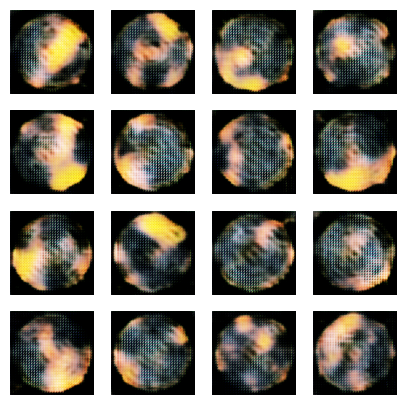

25/25 [==============================] - 25s 1s/step - d_loss: 3829.1733 - g_loss: 6339.7905
Epoch 282/500
25/25 [==============================] - 25s 1s/step - d_loss: 1767.9358 - g_loss: 3801.9565
Epoch 283/500
25/25 [==============================] - 26s 1s/step - d_loss: 2737.8425 - g_loss: 3062.7021
Epoch 284/500
25/25 [==============================] - 26s 1s/step - d_loss: 1798.9392 - g_loss: 2096.8167
Epoch 285/500
25/25 [==============================] - 26s 1s/step - d_loss: 1396.1193 - g_loss: 3223.7747
Epoch 286/500
25/25 [==============================] - 22s 865ms/step - d_loss: 1464.2349 - g_loss: 2299.5168
Epoch 287/500
25/25 [==============================] - 22s 865ms/step - d_loss: 2295.4087 - g_loss: 5507.0752
Epoch 288/500
25/25 [==============================] - 22s 897ms/step - d_loss: 3008.6416 - g_loss: 5748.3364
Epoch 289/500
25/25 [==============================] - 23s 923ms/step - d_loss: 2896.7954 - g_loss: 6428.6504
Epoch 290/500
25/25 [==================

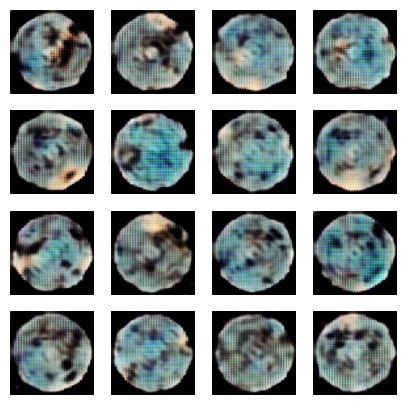

25/25 [==============================] - 25s 991ms/step - d_loss: 782.0549 - g_loss: 1034.3568
Epoch 292/500
25/25 [==============================] - 21s 849ms/step - d_loss: 338.5629 - g_loss: 1703.8862
Epoch 293/500
25/25 [==============================] - 21s 853ms/step - d_loss: 738.5449 - g_loss: 2148.9268
Epoch 294/500
25/25 [==============================] - 21s 851ms/step - d_loss: 2083.6304 - g_loss: 3661.0625
Epoch 295/500
25/25 [==============================] - 22s 863ms/step - d_loss: 1410.1829 - g_loss: 2922.0569
Epoch 296/500
25/25 [==============================] - 22s 877ms/step - d_loss: 1526.3297 - g_loss: 3123.5476
Epoch 297/500
25/25 [==============================] - 22s 886ms/step - d_loss: 1812.6200 - g_loss: 3579.7893
Epoch 298/500
25/25 [==============================] - 24s 951ms/step - d_loss: 1693.1295 - g_loss: 2138.1157
Epoch 299/500
25/25 [==============================] - 23s 930ms/step - d_loss: 1196.8521 - g_loss: 2424.6218
Epoch 300/500
25/25 [======

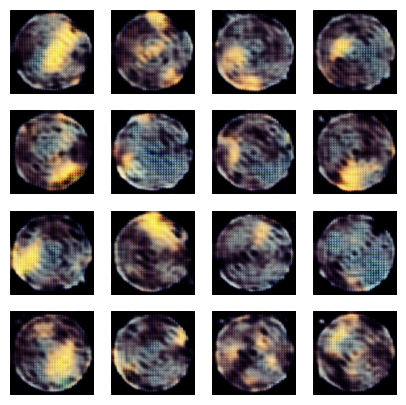

25/25 [==============================] - 24s 978ms/step - d_loss: 2003.0035 - g_loss: 4489.3232
Epoch 302/500
25/25 [==============================] - 25s 995ms/step - d_loss: 2621.2747 - g_loss: 3746.5049
Epoch 303/500
25/25 [==============================] - 25s 1s/step - d_loss: 2523.9929 - g_loss: 2259.1194
Epoch 304/500
25/25 [==============================] - 26s 1s/step - d_loss: 2970.0242 - g_loss: 4463.5122
Epoch 305/500
25/25 [==============================] - 27s 1s/step - d_loss: 2543.2827 - g_loss: 2987.8718
Epoch 306/500
25/25 [==============================] - 22s 865ms/step - d_loss: 2784.8167 - g_loss: 3686.3657
Epoch 307/500
25/25 [==============================] - 22s 880ms/step - d_loss: 2267.2507 - g_loss: 2333.5703
Epoch 308/500
25/25 [==============================] - 22s 894ms/step - d_loss: 2161.6790 - g_loss: 2622.8105
Epoch 309/500
25/25 [==============================] - 23s 907ms/step - d_loss: 2614.0190 - g_loss: 2802.8701
Epoch 310/500
25/25 [============

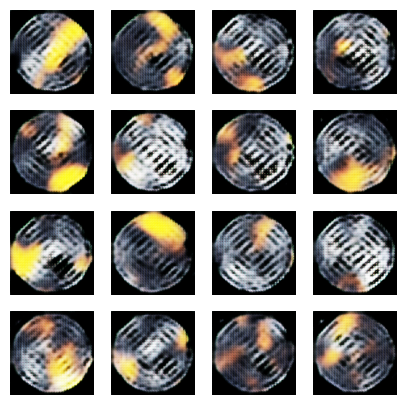

25/25 [==============================] - 24s 958ms/step - d_loss: 2491.8513 - g_loss: 2995.2124
Epoch 312/500
25/25 [==============================] - 24s 963ms/step - d_loss: 2551.7554 - g_loss: 2542.5879
Epoch 313/500
25/25 [==============================] - 24s 962ms/step - d_loss: 2599.0581 - g_loss: 3299.6477
Epoch 314/500
25/25 [==============================] - 25s 985ms/step - d_loss: 2402.4321 - g_loss: 2669.1812
Epoch 315/500
25/25 [==============================] - 25s 1s/step - d_loss: 2215.9673 - g_loss: 2325.8865
Epoch 316/500
25/25 [==============================] - 22s 869ms/step - d_loss: 2229.6375 - g_loss: 2859.6187
Epoch 317/500
25/25 [==============================] - 22s 878ms/step - d_loss: 2081.5325 - g_loss: 2486.2668
Epoch 318/500
25/25 [==============================] - 23s 933ms/step - d_loss: 2205.1667 - g_loss: 3055.5618
Epoch 319/500
25/25 [==============================] - 24s 943ms/step - d_loss: 2998.9341 - g_loss: 3612.1772
Epoch 320/500
25/25 [======

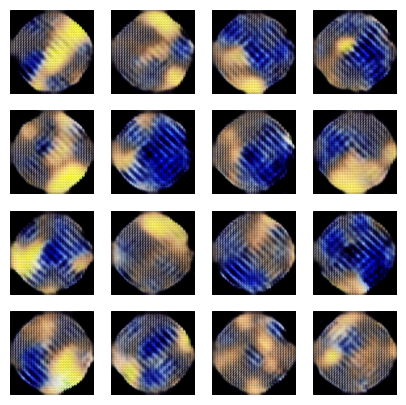

25/25 [==============================] - 25s 1s/step - d_loss: 2163.7666 - g_loss: 3538.2407
Epoch 322/500
25/25 [==============================] - 25s 1s/step - d_loss: 2094.1130 - g_loss: 2820.9517
Epoch 323/500
25/25 [==============================] - 26s 1s/step - d_loss: 2365.9736 - g_loss: 3018.4653
Epoch 324/500
25/25 [==============================] - 26s 1s/step - d_loss: 2103.5884 - g_loss: 2636.1387
Epoch 325/500
25/25 [==============================] - 27s 1s/step - d_loss: 2591.1326 - g_loss: 2143.3323
Epoch 326/500
25/25 [==============================] - 22s 873ms/step - d_loss: 2735.4919 - g_loss: 3499.4587
Epoch 327/500
25/25 [==============================] - 22s 875ms/step - d_loss: 2267.8918 - g_loss: 3816.9531
Epoch 328/500
25/25 [==============================] - 22s 896ms/step - d_loss: 1785.8480 - g_loss: 2712.0862
Epoch 329/500
25/25 [==============================] - 22s 892ms/step - d_loss: 2137.8840 - g_loss: 2853.3474
Epoch 330/500
25/25 [==================

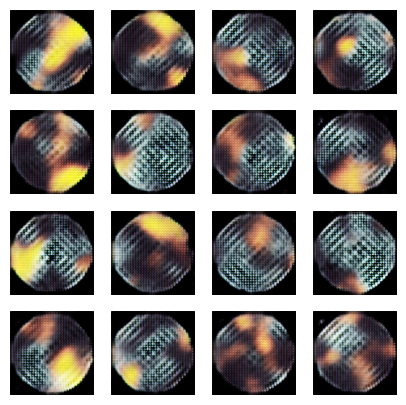

25/25 [==============================] - 25s 1s/step - d_loss: 1821.9156 - g_loss: 2147.2441
Epoch 332/500
25/25 [==============================] - 22s 866ms/step - d_loss: 1992.2954 - g_loss: 3353.8032
Epoch 333/500
25/25 [==============================] - 22s 873ms/step - d_loss: 1818.9480 - g_loss: 4513.2217
Epoch 334/500
25/25 [==============================] - 22s 871ms/step - d_loss: 2068.6650 - g_loss: 3836.5974
Epoch 335/500
25/25 [==============================] - 23s 923ms/step - d_loss: 1103.9207 - g_loss: 1921.9664
Epoch 336/500
25/25 [==============================] - 23s 937ms/step - d_loss: 1143.9977 - g_loss: 2127.9050
Epoch 337/500
25/25 [==============================] - 24s 956ms/step - d_loss: 1283.0145 - g_loss: 2126.9690
Epoch 338/500
25/25 [==============================] - 24s 977ms/step - d_loss: 2111.3569 - g_loss: 2547.5276
Epoch 339/500
25/25 [==============================] - 25s 985ms/step - d_loss: 1663.0728 - g_loss: 1705.7969
Epoch 340/500
25/25 [======

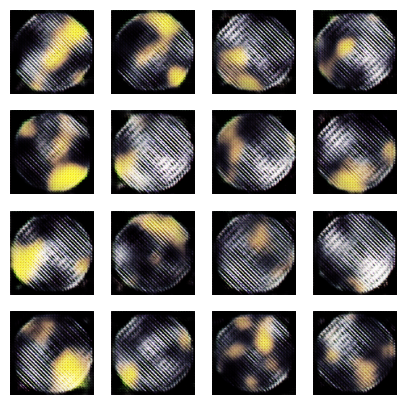

25/25 [==============================] - 28s 1s/step - d_loss: 1750.1556 - g_loss: 1788.9795
Epoch 342/500
25/25 [==============================] - 28s 1s/step - d_loss: 1716.6240 - g_loss: 2217.0046
Epoch 343/500
25/25 [==============================] - 22s 873ms/step - d_loss: 2131.4189 - g_loss: 3214.1331
Epoch 344/500
25/25 [==============================] - 22s 882ms/step - d_loss: 1451.3955 - g_loss: 1948.8510
Epoch 345/500
25/25 [==============================] - 22s 881ms/step - d_loss: 686.4911 - g_loss: 1768.4780
Epoch 346/500
25/25 [==============================] - 22s 900ms/step - d_loss: 590.0951 - g_loss: 1540.4497
Epoch 347/500
25/25 [==============================] - 23s 910ms/step - d_loss: 969.5558 - g_loss: 2040.7297
Epoch 348/500
25/25 [==============================] - 23s 906ms/step - d_loss: 1258.8511 - g_loss: 1967.1843
Epoch 349/500
25/25 [==============================] - 23s 909ms/step - d_loss: 3199.9004 - g_loss: 9902.9209
Epoch 350/500
25/25 [============

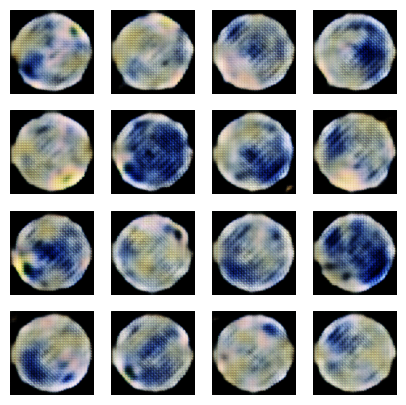

25/25 [==============================] - 23s 938ms/step - d_loss: 743.1789 - g_loss: 1526.1848
Epoch 352/500
25/25 [==============================] - 24s 951ms/step - d_loss: 306.4553 - g_loss: 1368.5284
Epoch 353/500
25/25 [==============================] - 22s 885ms/step - d_loss: 2518.4338 - g_loss: 9064.0234
Epoch 354/500
25/25 [==============================] - 22s 882ms/step - d_loss: 1842.2030 - g_loss: 3445.5984
Epoch 355/500
25/25 [==============================] - 23s 905ms/step - d_loss: 1407.8239 - g_loss: 1902.1509
Epoch 356/500
25/25 [==============================] - 24s 945ms/step - d_loss: 1860.1913 - g_loss: 3484.6934
Epoch 357/500
25/25 [==============================] - 23s 933ms/step - d_loss: 3131.1592 - g_loss: 5706.0894
Epoch 358/500
25/25 [==============================] - 22s 888ms/step - d_loss: 2347.3250 - g_loss: 2362.4119
Epoch 359/500
25/25 [==============================] - 23s 919ms/step - d_loss: 2117.5884 - g_loss: 3214.2585
Epoch 360/500
25/25 [=====

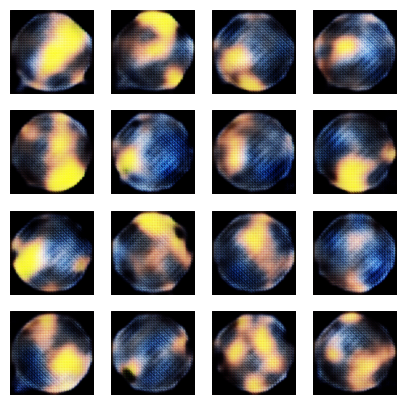

25/25 [==============================] - 24s 963ms/step - d_loss: 1614.8434 - g_loss: 3301.1035
Epoch 362/500
25/25 [==============================] - 23s 931ms/step - d_loss: 2220.5193 - g_loss: 2711.8188
Epoch 363/500
25/25 [==============================] - 24s 971ms/step - d_loss: 1748.4330 - g_loss: 2592.2520
Epoch 364/500
25/25 [==============================] - 25s 994ms/step - d_loss: 1595.9655 - g_loss: 2172.2073
Epoch 365/500
25/25 [==============================] - 22s 882ms/step - d_loss: 1443.6854 - g_loss: 1207.3027
Epoch 366/500
25/25 [==============================] - 22s 891ms/step - d_loss: 1494.7280 - g_loss: 1734.9889
Epoch 367/500
25/25 [==============================] - 23s 906ms/step - d_loss: 2767.0225 - g_loss: 3089.3438
Epoch 368/500
25/25 [==============================] - 22s 889ms/step - d_loss: 1461.8501 - g_loss: 2097.4226
Epoch 369/500
25/25 [==============================] - 23s 914ms/step - d_loss: 1042.1068 - g_loss: 1937.2959
Epoch 370/500
25/25 [===

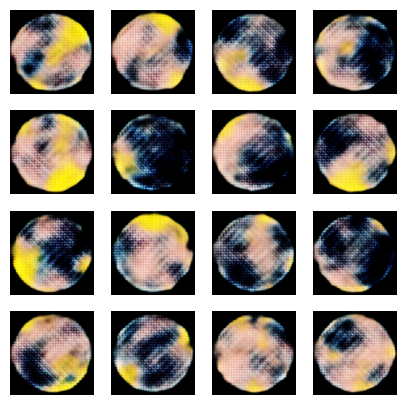

25/25 [==============================] - 24s 960ms/step - d_loss: 1921.4399 - g_loss: 3033.6704
Epoch 372/500
25/25 [==============================] - 23s 929ms/step - d_loss: 1506.5787 - g_loss: 3215.6843
Epoch 373/500
25/25 [==============================] - 24s 945ms/step - d_loss: 2217.5205 - g_loss: 3541.0715
Epoch 374/500
25/25 [==============================] - 24s 975ms/step - d_loss: 1500.7924 - g_loss: 1973.0732
Epoch 375/500
25/25 [==============================] - 23s 912ms/step - d_loss: 1834.7683 - g_loss: 3818.0503
Epoch 376/500
25/25 [==============================] - 23s 909ms/step - d_loss: 1761.0833 - g_loss: 2267.9385
Epoch 377/500
25/25 [==============================] - 22s 902ms/step - d_loss: 1470.3553 - g_loss: 2240.0239
Epoch 378/500
25/25 [==============================] - 25s 990ms/step - d_loss: 1439.1598 - g_loss: 2889.0415
Epoch 379/500
25/25 [==============================] - 25s 1s/step - d_loss: 955.0886 - g_loss: 2153.4731
Epoch 380/500
25/25 [=======

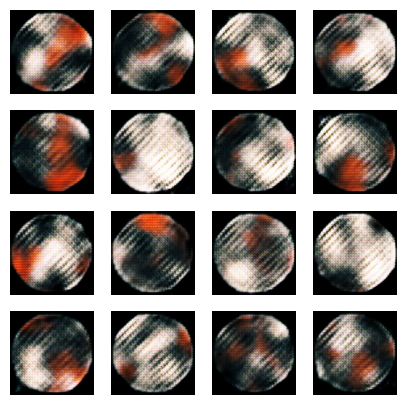

25/25 [==============================] - 26s 1s/step - d_loss: 1558.0640 - g_loss: 2819.6455
Epoch 382/500
25/25 [==============================] - 27s 1s/step - d_loss: 1151.7826 - g_loss: 2826.6470
Epoch 383/500
25/25 [==============================] - 28s 1s/step - d_loss: 1426.8281 - g_loss: 2035.0201
Epoch 384/500
25/25 [==============================] - 22s 894ms/step - d_loss: 893.7628 - g_loss: 389.9590
Epoch 385/500
25/25 [==============================] - 23s 934ms/step - d_loss: 268.3571 - g_loss: 574.5344
Epoch 386/500
25/25 [==============================] - 22s 888ms/step - d_loss: 1395.8992 - g_loss: 1803.4850
Epoch 387/500
25/25 [==============================] - 23s 906ms/step - d_loss: 1152.1776 - g_loss: 1456.5054
Epoch 388/500
25/25 [==============================] - 23s 916ms/step - d_loss: 1038.7766 - g_loss: 2660.4155
Epoch 389/500
25/25 [==============================] - 23s 938ms/step - d_loss: 2163.9248 - g_loss: 2391.2068
Epoch 390/500
25/25 [================

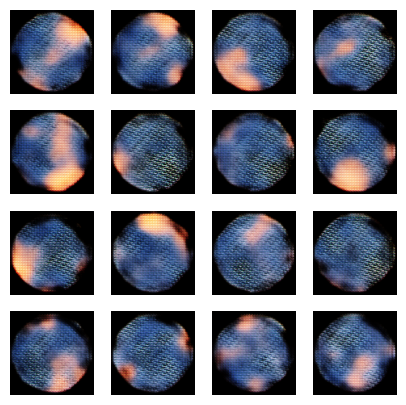

25/25 [==============================] - 24s 972ms/step - d_loss: 1070.5526 - g_loss: 2063.0371
Epoch 392/500
25/25 [==============================] - 24s 976ms/step - d_loss: 408.4435 - g_loss: 1417.6312
Epoch 393/500
25/25 [==============================] - 24s 964ms/step - d_loss: 1160.1058 - g_loss: 2160.7273
Epoch 394/500
25/25 [==============================] - 25s 1s/step - d_loss: 1651.7172 - g_loss: 4674.3174
Epoch 395/500
25/25 [==============================] - 21s 861ms/step - d_loss: 780.8393 - g_loss: 985.9630
Epoch 396/500
25/25 [==============================] - 21s 860ms/step - d_loss: 1053.7019 - g_loss: 1329.9600
Epoch 397/500
25/25 [==============================] - 22s 874ms/step - d_loss: 953.8597 - g_loss: 1721.2242
Epoch 398/500
25/25 [==============================] - 23s 942ms/step - d_loss: 1406.8761 - g_loss: 2808.7378
Epoch 399/500
25/25 [==============================] - 24s 971ms/step - d_loss: 1411.5327 - g_loss: 1660.9465
Epoch 400/500
25/25 [==========

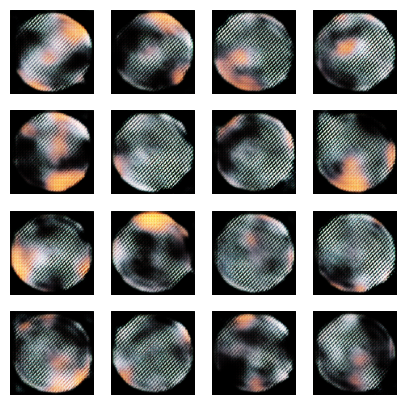

25/25 [==============================] - 25s 1s/step - d_loss: 1197.2866 - g_loss: 416.0777
Epoch 402/500
25/25 [==============================] - 26s 1s/step - d_loss: 1246.4474 - g_loss: 2060.5447
Epoch 403/500
25/25 [==============================] - 26s 1s/step - d_loss: 1382.5212 - g_loss: 2457.7104
Epoch 404/500
25/25 [==============================] - 27s 1s/step - d_loss: 1375.5178 - g_loss: 1690.4840
Epoch 405/500
25/25 [==============================] - 21s 858ms/step - d_loss: 1110.9200 - g_loss: 1184.4000
Epoch 406/500
25/25 [==============================] - 22s 871ms/step - d_loss: 1141.1440 - g_loss: 1167.3236
Epoch 407/500
25/25 [==============================] - 22s 875ms/step - d_loss: 1523.3250 - g_loss: 1800.1232
Epoch 408/500
25/25 [==============================] - 23s 907ms/step - d_loss: 1539.4878 - g_loss: 2049.8860
Epoch 409/500
25/25 [==============================] - 23s 936ms/step - d_loss: 1653.2880 - g_loss: 1574.1274
Epoch 410/500
25/25 [================

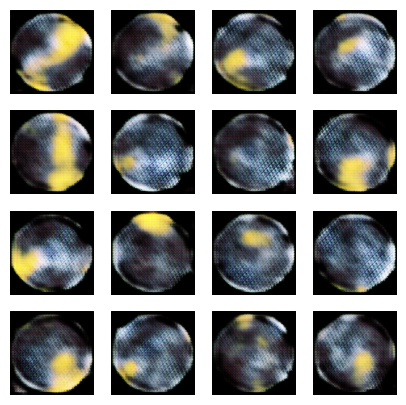

25/25 [==============================] - 26s 1s/step - d_loss: 1347.2314 - g_loss: 1436.8790
Epoch 412/500
25/25 [==============================] - 25s 1s/step - d_loss: 1311.2794 - g_loss: 1840.5948
Epoch 413/500
25/25 [==============================] - 26s 1s/step - d_loss: 1241.3612 - g_loss: 1596.8988
Epoch 414/500
25/25 [==============================] - 26s 1s/step - d_loss: 852.3431 - g_loss: 1200.0701
Epoch 415/500
25/25 [==============================] - 21s 849ms/step - d_loss: 1000.4874 - g_loss: 1345.6508
Epoch 416/500
25/25 [==============================] - 22s 865ms/step - d_loss: 845.5567 - g_loss: 1310.4734
Epoch 417/500
25/25 [==============================] - 22s 893ms/step - d_loss: 721.6079 - g_loss: 1355.8103
Epoch 418/500
25/25 [==============================] - 23s 904ms/step - d_loss: 878.0559 - g_loss: 1336.9325
Epoch 419/500
25/25 [==============================] - 23s 929ms/step - d_loss: 679.5502 - g_loss: 1336.1985
Epoch 420/500
25/25 [====================

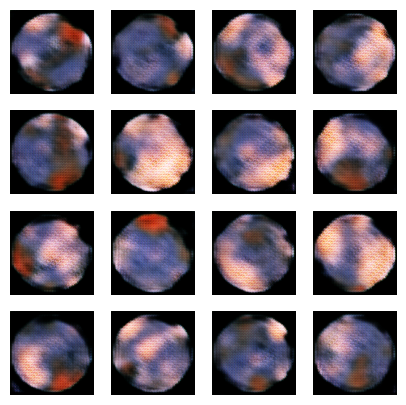

25/25 [==============================] - 25s 985ms/step - d_loss: 884.4913 - g_loss: 1549.2261
Epoch 422/500
25/25 [==============================] - 26s 1s/step - d_loss: 587.5675 - g_loss: 1239.1042
Epoch 423/500
25/25 [==============================] - 26s 1s/step - d_loss: 567.8254 - g_loss: 1203.7388
Epoch 424/500
25/25 [==============================] - 21s 854ms/step - d_loss: 716.4947 - g_loss: 917.7871
Epoch 425/500
25/25 [==============================] - 22s 865ms/step - d_loss: 473.0445 - g_loss: 1477.1422
Epoch 426/500
25/25 [==============================] - 22s 874ms/step - d_loss: 1540.9083 - g_loss: 2697.8792
Epoch 427/500
25/25 [==============================] - 22s 893ms/step - d_loss: 1120.5959 - g_loss: 1785.8818
Epoch 428/500
25/25 [==============================] - 23s 904ms/step - d_loss: 427.6157 - g_loss: 843.0650
Epoch 429/500
25/25 [==============================] - 23s 933ms/step - d_loss: 721.0667 - g_loss: 1314.7261
Epoch 430/500
25/25 [==================

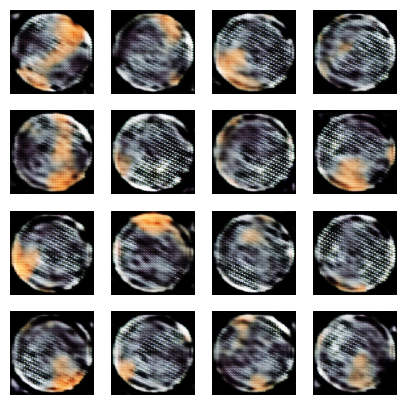

25/25 [==============================] - 25s 989ms/step - d_loss: 605.0577 - g_loss: 991.4728
Epoch 432/500
25/25 [==============================] - 25s 997ms/step - d_loss: 1027.5924 - g_loss: 1699.9999
Epoch 433/500
25/25 [==============================] - 25s 1s/step - d_loss: 1256.1555 - g_loss: 2084.7646
Epoch 434/500
25/25 [==============================] - 26s 1s/step - d_loss: 1490.2227 - g_loss: 1640.5670
Epoch 435/500
25/25 [==============================] - 22s 866ms/step - d_loss: 1278.1803 - g_loss: 1375.2249
Epoch 436/500
25/25 [==============================] - 22s 871ms/step - d_loss: 1262.3727 - g_loss: 1409.7747
Epoch 437/500
25/25 [==============================] - 22s 872ms/step - d_loss: 1331.0344 - g_loss: 1349.3004
Epoch 438/500
25/25 [==============================] - 23s 933ms/step - d_loss: 1323.2942 - g_loss: 1589.7125
Epoch 439/500
25/25 [==============================] - 24s 970ms/step - d_loss: 1061.4750 - g_loss: 1388.7850
Epoch 440/500
25/25 [===========

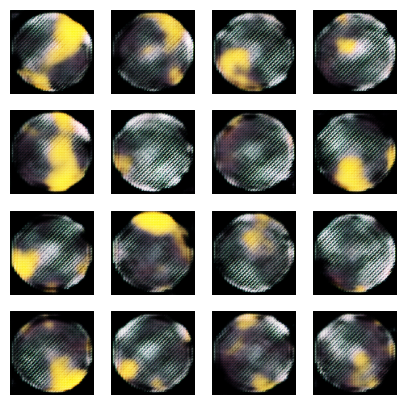

25/25 [==============================] - 25s 1s/step - d_loss: 1563.5854 - g_loss: 1427.6201
Epoch 442/500
25/25 [==============================] - 26s 1s/step - d_loss: 1350.3242 - g_loss: 1599.3558
Epoch 443/500
25/25 [==============================] - 26s 1s/step - d_loss: 1256.5916 - g_loss: 1697.7535
Epoch 444/500
25/25 [==============================] - 30s 1s/step - d_loss: 1627.9489 - g_loss: 1589.8550
Epoch 445/500
25/25 [==============================] - 22s 873ms/step - d_loss: 1438.3717 - g_loss: 1635.4833
Epoch 446/500
25/25 [==============================] - 22s 877ms/step - d_loss: 1296.6129 - g_loss: 1366.4949
Epoch 447/500
25/25 [==============================] - 22s 895ms/step - d_loss: 1261.6722 - g_loss: 1751.9829
Epoch 448/500
25/25 [==============================] - 23s 918ms/step - d_loss: 1307.1201 - g_loss: 1651.1774
Epoch 449/500
25/25 [==============================] - 24s 959ms/step - d_loss: 1456.0691 - g_loss: 2007.1299
Epoch 450/500
25/25 [===============

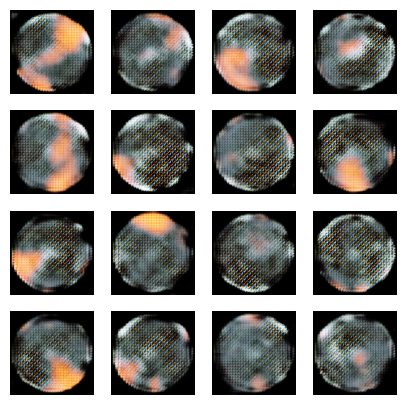

25/25 [==============================] - 25s 986ms/step - d_loss: 506.0226 - g_loss: 1643.8009
Epoch 452/500
25/25 [==============================] - 25s 998ms/step - d_loss: 698.4726 - g_loss: 1504.3478
Epoch 453/500
25/25 [==============================] - 25s 1s/step - d_loss: 680.2927 - g_loss: 1457.4595
Epoch 454/500
25/25 [==============================] - 26s 1s/step - d_loss: 1121.7461 - g_loss: 1971.0391
Epoch 455/500
25/25 [==============================] - 21s 862ms/step - d_loss: 667.5688 - g_loss: 1160.2875
Epoch 456/500
25/25 [==============================] - 22s 876ms/step - d_loss: 705.8789 - g_loss: 1083.9037
Epoch 457/500
25/25 [==============================] - 22s 883ms/step - d_loss: 1002.4148 - g_loss: 1635.3063
Epoch 458/500
25/25 [==============================] - 22s 892ms/step - d_loss: 1025.3666 - g_loss: 1354.1689
Epoch 459/500
25/25 [==============================] - 24s 944ms/step - d_loss: 1458.7108 - g_loss: 1595.3236
Epoch 460/500
25/25 [==============

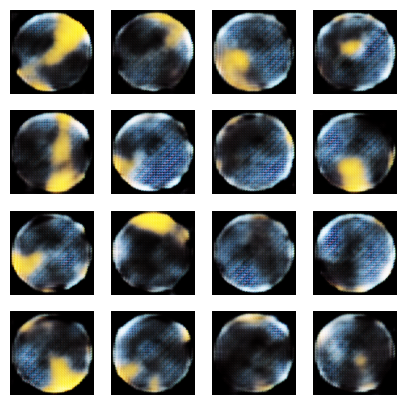

25/25 [==============================] - 24s 947ms/step - d_loss: 831.0767 - g_loss: 1280.2672
Epoch 462/500
25/25 [==============================] - 24s 969ms/step - d_loss: 953.0686 - g_loss: 1377.0381
Epoch 463/500
25/25 [==============================] - 21s 853ms/step - d_loss: 1047.8586 - g_loss: 1411.6451
Epoch 464/500
25/25 [==============================] - 21s 854ms/step - d_loss: 1023.0397 - g_loss: 1365.6145
Epoch 465/500
25/25 [==============================] - 22s 869ms/step - d_loss: 1096.4784 - g_loss: 1460.0791
Epoch 466/500
25/25 [==============================] - 23s 912ms/step - d_loss: 901.3875 - g_loss: 1533.0162
Epoch 467/500
25/25 [==============================] - 24s 952ms/step - d_loss: 1032.4457 - g_loss: 1426.6038
Epoch 468/500
25/25 [==============================] - 24s 962ms/step - d_loss: 1134.1740 - g_loss: 1572.5648
Epoch 469/500
25/25 [==============================] - 25s 1s/step - d_loss: 1285.5048 - g_loss: 1978.3041
Epoch 470/500
25/25 [=========

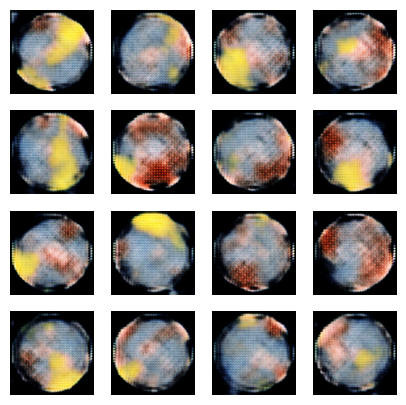

25/25 [==============================] - 29s 1s/step - d_loss: 975.8667 - g_loss: 1308.2831
Epoch 472/500
25/25 [==============================] - 35s 1s/step - d_loss: 930.4385 - g_loss: 865.4375
Epoch 473/500
25/25 [==============================] - 35s 1s/step - d_loss: 405.2088 - g_loss: 180.0691
Epoch 474/500
25/25 [==============================] - 36s 1s/step - d_loss: 380.4231 - g_loss: 174.9874
Epoch 475/500
25/25 [==============================] - 22s 889ms/step - d_loss: 577.8062 - g_loss: 87.8660
Epoch 476/500
25/25 [==============================] - 22s 895ms/step - d_loss: 463.1517 - g_loss: 687.2952
Epoch 477/500
25/25 [==============================] - 22s 902ms/step - d_loss: 455.5161 - g_loss: 1146.0449
Epoch 478/500
25/25 [==============================] - 23s 937ms/step - d_loss: 659.1814 - g_loss: 1397.0959
Epoch 479/500
25/25 [==============================] - 23s 932ms/step - d_loss: 837.7333 - g_loss: 1637.6892
Epoch 480/500
25/25 [==============================

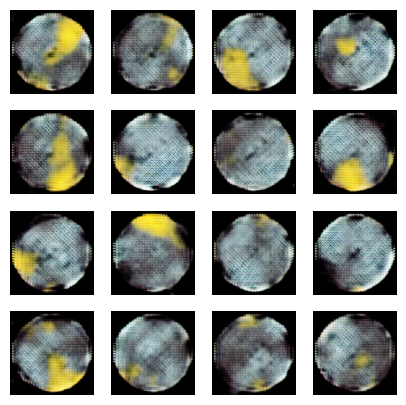

25/25 [==============================] - 25s 994ms/step - d_loss: 710.7720 - g_loss: 908.2871
Epoch 482/500
25/25 [==============================] - 25s 991ms/step - d_loss: 942.4785 - g_loss: 1279.2024
Epoch 483/500
25/25 [==============================] - 25s 1s/step - d_loss: 767.0183 - g_loss: 982.9875
Epoch 484/500
25/25 [==============================] - 26s 1s/step - d_loss: 769.3455 - g_loss: 1385.9441
Epoch 485/500
25/25 [==============================] - 21s 856ms/step - d_loss: 868.1892 - g_loss: 1451.4722
Epoch 486/500
25/25 [==============================] - 22s 863ms/step - d_loss: 952.2210 - g_loss: 1613.5212
Epoch 487/500
25/25 [==============================] - 22s 872ms/step - d_loss: 1503.4608 - g_loss: 1476.9683
Epoch 488/500
25/25 [==============================] - 22s 876ms/step - d_loss: 977.4215 - g_loss: 1300.9050
Epoch 489/500
25/25 [==============================] - 22s 899ms/step - d_loss: 678.4649 - g_loss: 1357.1228
Epoch 490/500
25/25 [===================

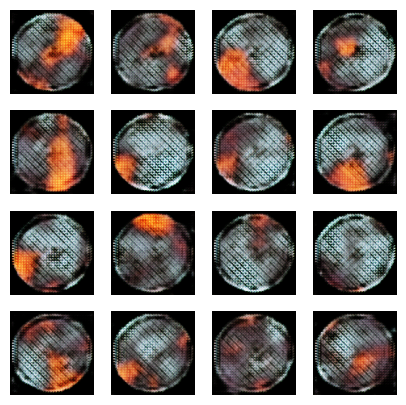

25/25 [==============================] - 24s 953ms/step - d_loss: 711.6622 - g_loss: 1431.5240
Epoch 492/500
25/25 [==============================] - 24s 959ms/step - d_loss: 776.4724 - g_loss: 2024.7191
Epoch 493/500
25/25 [==============================] - 24s 979ms/step - d_loss: 970.0820 - g_loss: 1633.7236
Epoch 494/500
25/25 [==============================] - 25s 1s/step - d_loss: 1063.6531 - g_loss: 1835.6050
Epoch 495/500
25/25 [==============================] - 22s 867ms/step - d_loss: 605.3937 - g_loss: 863.0616
Epoch 496/500
25/25 [==============================] - 22s 875ms/step - d_loss: 255.0591 - g_loss: 671.6498
Epoch 497/500
25/25 [==============================] - 22s 885ms/step - d_loss: 89.2156 - g_loss: 645.1122
Epoch 498/500
25/25 [==============================] - 23s 908ms/step - d_loss: 370.3518 - g_loss: 756.9241
Epoch 499/500
25/25 [==============================] - 24s 943ms/step - d_loss: 755.8295 - g_loss: 968.4586
Epoch 500/500
25/25 [====================

In [14]:
# number of epochs
NUM_EPOCHS = 500 
SESJA = 1

dcgan.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])

# Deployment

Tworzenie gifa z wyników generowania planet w każdej epoce

In [16]:
import glob
import contextlib
from PIL import Image

# filepaths
fp_in = "./results_128_v1/*.jpg"
fp_out = "./results_128_v1/epochs128_v1.gif"

# use exit stack to automatically close opened images
with contextlib.ExitStack() as stack:

    # lazily load images
    imgs = (stack.enter_context(Image.open(f))
            for f in sorted(glob.glob(fp_in)))

    # extract  first image from iterator
    img = next(imgs)

    # https://pillow.readthedocs.io/en/stable/handbook/image-file-formats.html#gif
    img.save(fp=fp_out, format='GIF', append_images=imgs,
             save_all=True, duration=1, loop=0)